# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [12]:
from utils import get_dataset

In [54]:
dataset = get_dataset(tfrecord_path="../../data/processed/*.tfrecord",
                      label_map='../experiments/label_map.pbtxt')

INFO:tensorflow:Reading unweighted datasets: ['../../data/processed/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['../../data/processed/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 100


## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [159]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tensorflow.compat.v1 as tf

def display_instances(batch, imgs_to_display=12):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    num_cols = 4
    if imgs_to_display % num_cols == 0:
        num_rows = imgs_to_display // num_cols
    else:
        num_rows = imgs_to_display % num_cols + 1

    # Setup plot space
    _, axs = plt.subplots(nrows=num_rows,
                            ncols=num_cols,
                            figsize=(60, 60))

    # Colour mapping 
    # vehicles, 1: red, pedestrians, 2: blue, cyclists, 4: green
    colour_map = {1: 'red', 2: 'blue', 4: 'green'}

    for idx, record in enumerate(batch):

        # Get current row and col in subplots
        curr_row = idx // num_cols
        curr_col = idx % num_cols

        # Get metadata from dataset
        img = record["image"].numpy()
        img_shape = record["original_image_spatial_shape"].numpy()
        filename = record["filename"]
        truth_bboxes = record["groundtruth_boxes"].numpy()
        truth_classes = record["groundtruth_classes"].numpy()
        
        # Scale ground truth bounding boxes up to image size
        scaled_bboxes = truth_bboxes * np.tile(img_shape, 2)

        # Annotate bounding boxes
        for box, cls in zip(scaled_bboxes, truth_classes):
            btm_left = (box[1], box[0])                       
            width = box[3] - box[1]
            height = box[2] - box[0]

            # Annotate rectangle
            rec = patches.Rectangle(btm_left, width, height, linewidth=4, edgecolor=colour_map[cls], facecolor='none')
            axs[curr_row, curr_col].add_patch(rec)

        # Plot
        axs[curr_row, curr_col].imshow(img)
        plt.imshow(img)


## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

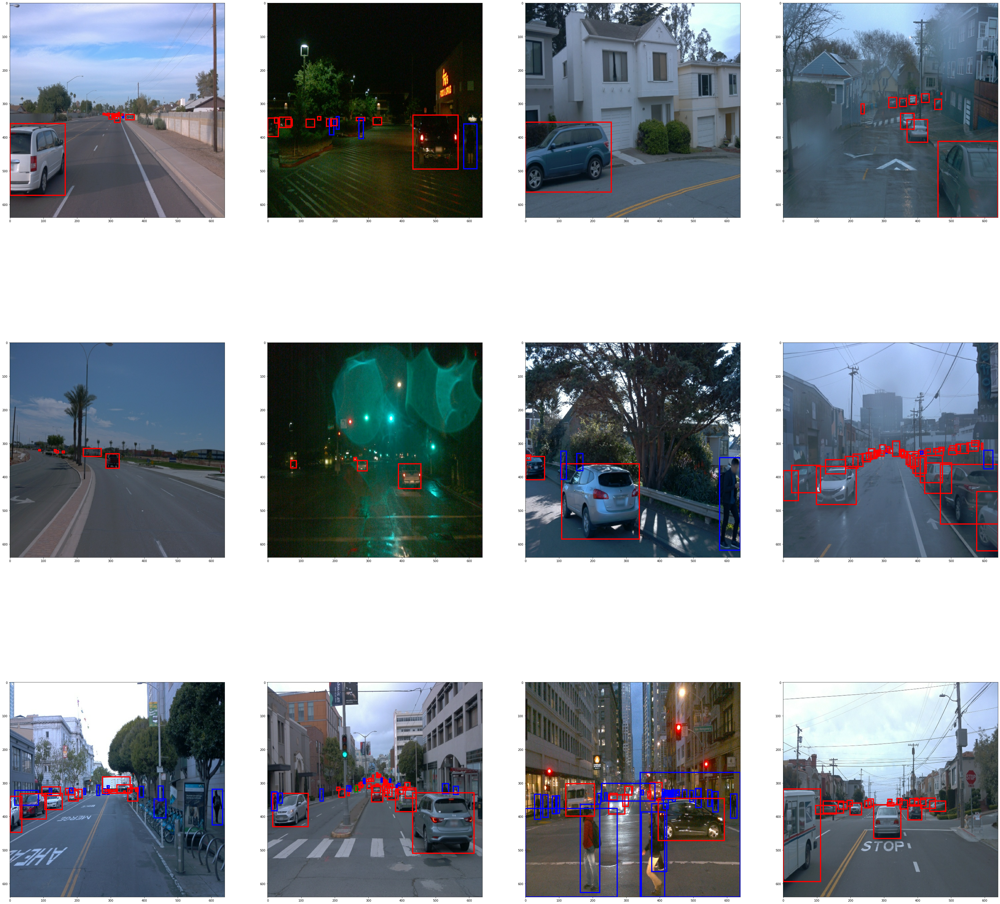

In [160]:
imgs_to_display = 12

batch = dataset.shuffle(100, reshuffle_each_iteration=True).take(imgs_to_display)
display_instances(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...